In [1]:
import os
import time
import pickle
import networkx as nx
import matplotlib.pyplot as plt

import numpy as np
from numpy import linalg as LA
from numpy import histogram2d

from scipy import signal
from scipy.fft import fft, fftfreq, fftshift
from scipy.signal import find_peaks, butter, filtfilt
from scipy.ndimage import gaussian_filter
from scipy.io import wavfile

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

import utils as ut
%load_ext autoreload
%autoreload 2

In [3]:
data_file = "../data/scooter_example_1.wav"
fs, data = wavfile.read(data_file)

# crop data
start_time = 60 # seconds
end_time = 160 # seconds
data = data[int(start_time*fs):int(end_time*fs)]

# data_file = "../data/12062025_example.wav"
# fs, data = wavfile.read(data_file)


# set time annotations
# 1st detection: 3-37 seconds
# 2nd detection: 91-143 seconds
# need to account for time cropping
time_annotations = np.zeros_like(data, dtype=int)
# time_annotations[int(3*fs):int(37*fs)] = 1
time_annotations[int(11*fs):int(63*fs)] = 1


print(f"Sample rate: {fs} Hz")
print(f"Data shape: {data.shape}")
print(f"Positive Annotations: {np.sum(time_annotations)} samples, {np.sum(time_annotations)/fs} seconds")
print(f"Negative Annotations: {np.sum(time_annotations==0)} samples, {np.sum(time_annotations==0)/fs} seconds")

f, t, Sxx = ut.get_spectrogram(data, fs)
ut.plot_spectrogram(f, t, Sxx)

Sample rate: 128000 Hz
Data shape: (12800000,)
Positive Annotations: 6656000 samples, 52.0 seconds
Negative Annotations: 6144000 samples, 48.0 seconds


/var/folders/3d/d9dsxkl92nz9mr2x53ct_fvh0000gn/T/ipykernel_78955/2291093349.py:2: WavFileWarning:

Chunk (non-data) not understood, skipping it.



---

## Cross Correlation

Seconds per time bin: 0.4484304932735426 seconds
Window size: 66 time bins


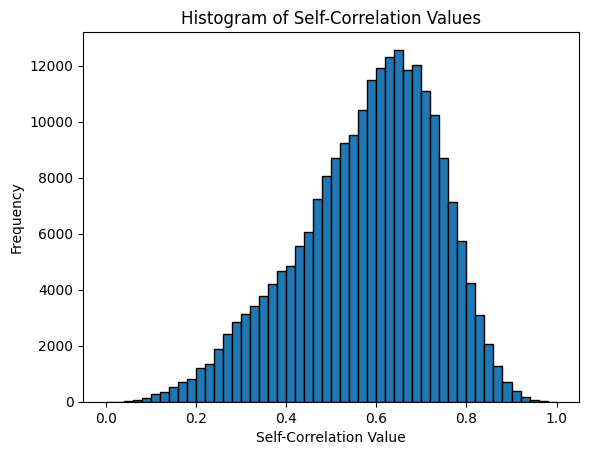

In [20]:
seconds_per_time_bin = (len(data) / fs) / len(t)
print(f"Seconds per time bin: {seconds_per_time_bin} seconds")

seconds = 30 # seconds
win_size = int(seconds / seconds_per_time_bin)
print(f"Window size: {win_size} time bins")

# self-correlation for axis=0 (frequency axis) over running window size win_size
Sxx_corr = np.zeros_like(Sxx)
for i in range(Sxx.shape[1]):
    start_idx = max(0, i - win_size // 2)
    end_idx = min(Sxx.shape[1], i + win_size // 2)
    window = Sxx[:, start_idx:end_idx]
    # compute self-correlation matrix
    corr_matrix = np.corrcoef(window)
    # take mean of correlation matrix along axis 0
    Sxx_corr[:, i] = np.mean(corr_matrix, axis=0)

#normalize Sxx_corr to [0, 1]
Sxx_corr = (Sxx_corr - np.min(Sxx_corr)) / (np.max(Sxx_corr) - np.min(Sxx_corr))

# plot histogram of self-correlation values
hist, bins = np.histogram(Sxx_corr, bins=50)
plt.figure()
plt.bar(bins[:-1], hist, width=np.diff(bins), edgecolor="black", align="edge")
plt.title("Histogram of Self-Correlation Values")
plt.xlabel("Self-Correlation Value")
plt.ylabel("Frequency")
plt.show()

ut.plot_spectrogram(f, t, Sxx, title="Original Spectrogram", show=True)
ut.plot_spectrogram(f, t, Sxx_corr, title="Self-Correlation Spectrogram")

---


## Local Entropy

In [23]:
band = 15 # frequency bins
seconds = 30 # seconds
win_size = int(seconds / seconds_per_time_bin)

local_entropy = np.zeros_like(Sxx)
for _t in range(Sxx.shape[1]):
    for _f in range(Sxx.shape[0]):
        start_t_idx = max(0, _t - win_size // 2)
        end_t_idx = min(Sxx.shape[1], _t + win_size // 2)
        start_f_idx = max(0, _f - band // 2)
        end_f_idx = min(Sxx.shape[0], _f + band // 2)
        window = Sxx[_f, start_t_idx:end_t_idx]
        window_env = Sxx[start_f_idx:end_f_idx, start_t_idx:end_t_idx]
        local_entropy[_f, _t] = ut.entropy(window) / (ut.entropy(window_env.flatten()) + 1e-10)
#normalize local_entropy to [0, 1]
local_entropy = (local_entropy - np.min(local_entropy)) / (np.max(local_entropy) - np.min(local_entropy))
ut.plot_spectrogram(f, t, local_entropy, title="Local Entropy Spectrogram")


---

## peak detector + HMM

In [24]:
# peak detection along frequency axis
peaks = np.zeros_like(Sxx)
for i in range(Sxx.shape[1]):
    freq_slice = Sxx[:, i]
    peak_indices, _ = find_peaks(freq_slice, height=np.mean(freq_slice)+np.std(freq_slice))
    peaks[peak_indices, i] = freq_slice[peak_indices]
ut.plot_spectrogram(f, t, peaks, title="Peak Detection Spectrogram")